In [101]:
import numpy as np
import pandas as pd
import  json

import pandas as pd
import numpy as np
import cv2
import os
from PIL import Image
import matplotlib.pyplot as plt
from functools import reduce

In [63]:
data_json = "../data.json"
output= "../data/interim/output/output_v2.json"

In [64]:
def load_output(path: str) -> pd.DataFrame:
    """Load and Process Output File.

    Loads and processes output file labeled by the previous visual grounding
    model. Besides coordinates of BBs, length and height are also added to
    the DataFrame. All BBs, that start at 0.0, 0.0 are dropped and considered
    a failure.

    :param path: Path to output file.
    :return: DataFrame of imported output file.
    """
    output: any = open(str(path),"r")
    output = output.read()
    output = output.split("/n")
    del output[6000]
    output = [json.loads(d) for d in output]

    id = [d["file"].split(".")[0] for d in output]
    x1 = [d["result"][0]["box"][0] for d in output]
    y1 = [d["result"][0]["box"][1] for d in output]
    x2 = [d["result"][0]["box"][2] for d in output]
    y2 = [d["result"][0]["box"][3] for d in output]

    outputs_bb = pd.DataFrame(np.array([id,x1,y1,x2,y2]).T, columns=["id","x1","y1","x2","y2"])

    outputs_bb['id'] = outputs_bb['id'].astype("int64")
    outputs_bb['x1'] = round(outputs_bb['x1'].astype("float"))
    outputs_bb['y1'] = round(outputs_bb['y1'].astype("float"))
    outputs_bb['x2'] = round(outputs_bb['x2'].astype("float"))
    outputs_bb['y2'] = round(outputs_bb['y2'].astype("float"))

    # Getting the length and height of the Bounding Boxes
    outputs_bb["length"] = outputs_bb["x2"] - outputs_bb["x1"]
    outputs_bb["height"] = outputs_bb["y2"] - outputs_bb["y1"]

    # Removing all BBs with a length larger than 1600
    outputs_bb_df = outputs_bb[(outputs_bb["length"]<1600)& (outputs_bb["height"]<1000)].copy()
    return outputs_bb_df

In [65]:
load_output(output)

,id,x1,y1,x2,y2,length,height
0,213894,217.0,70.0,589.0,202.0,372.0,132.0
1,210622,61.0,35.0,282.0,122.0,221.0,87.0
2,198359,105.0,32.0,402.0,191.0,297.0,159.0
3,37639,51.0,51.0,350.0,184.0,299.0,133.0
4,297240,46.0,71.0,279.0,156.0,233.0,85.0
...,...,...,...,...,...,...,...
5995,207390,163.0,81.0,436.0,203.0,273.0,122.0
5996,211066,105.0,63.0,290.0,143.0,185.0,80.0
5997,210113,160.0,72.0,490.0,183.0,330.0,111.0
5998,96330,115.0,50.0,452.0,187.0,337.0,137.0


In [66]:
def load_data_json(path: str) -> pd.DataFrame:
    """ Load data.json.

    Load `data.json` file from main data ('MLW') directory.

    :param path: Path to data.json in the  '<drive>/MLW' directory.
    :return: DataFrame of imported data.
    """
    f = open(path)
    data = json.load(f)
    data = pd.DataFrame(data)
    data["length_lemma"] = [len(i) for i in data["lemma"]]
    return data

In [67]:
def create_dataset(path2datajson: str, path2output: str) -> pd.DataFrame:
    """Create Dataset to Label.

    Function to merge output and data.json datasets. Both datasets are
    first loaded and subsequently merged.

    :param path2datajson: Path to `data.json` file.
    :param path2output: Path to `output` file.
    :return: Merged Dataset.
    """
    datajson: pd.DataFrame = load_data_json(path2datajson)
    dataoutput: pd.DataFrame = load_output(path2output)
    data: pd.DataFrame = datajson.merge(dataoutput, on="id")
    return data

In [68]:
df = create_dataset(data_json, output)

In [92]:
len(df)

6000

In [91]:
df_view = df[df['length_lemma'] < 3].copy()

In [93]:
df_view

,id,lemma,length_lemma,x1,y1,x2,y2,length,height
704,47818,si,2,225.0,208.0,898.0,268.0,673.0,60.0
705,47853,si,2,115.0,158.0,605.0,201.0,490.0,43.0
706,47858,si,2,247.0,299.0,700.0,360.0,453.0,61.0
707,47862,si,2,181.0,241.0,646.0,273.0,465.0,32.0
708,47872,si,2,114.0,216.0,601.0,255.0,487.0,39.0
...,...,...,...,...,...,...,...,...,...
5787,304194,ne,2,523.0,220.0,771.0,273.0,248.0,53.0
5788,304208,ne,2,100.0,249.0,1050.0,302.0,950.0,53.0
5789,304209,ne,2,181.0,169.0,631.0,214.0,450.0,45.0
5790,304218,ne,2,174.0,280.0,770.0,364.0,596.0,84.0


In [97]:
for e in df_view.head(5).iterrows():
    print(e[1].x1, e[1].x2, e[1].y1, e[1].y2)

225.0 898.0 208.0 268.0
115.0 605.0 158.0 201.0
247.0 700.0 299.0 360.0
181.0 646.0 241.0 273.0
114.0 601.0 216.0 255.0


In [112]:
from PIL import Image
import os
import cv2
def vis_cluster_sample_single(
        data: pd.DataFrame,
        path_images: str,
        columns: int=4,
        rows: int=5,
        w: int=40,
        h: int=40) -> None:

    # Sample
    if len(data) < columns * rows:
        X = data
    else:
        indices = np.random.choice(range(len(data)), columns * rows)
        X = data.iloc[indices]

    # Get Images
    images: list = list()
    for _, e in X.iterrows():
        img = np.asarray(Image.open(os.path.join(path_images, str(e['id']) + '.jpg'), mode="r"))
        y, x, _ = img.shape
        x1, y1, x2, y2 = e.x1, e.y1, e.x2, e.y2
        cv2.rectangle(
            img,
            (int(x1), int(y1)),
            (int(x2), int(y2)),
            (0, 255, 0),
            3
        )
        images.append(img)

    # Process Images
    dims = list(map(lambda e: e.shape, images))
    size_height, size_width = tuple(map(lambda e: min(e), [list(t) for t in zip(*dims)][0:2]))
    images_cropped = list(map(lambda e: e[0:size_height, 0:size_width], images))

    fig, axs = plt.subplots(rows, columns, figsize=(w, h), constrained_layout=True,
                        sharex=True, sharey=True)

    for i, ax in enumerate(axs.flat):
        ax.imshow(Image.fromarray(images_cropped[i]))
        ax.set_title(
            str(X['id'].values[i]) + '.jpg',
            fontsize='small',
            loc='left')
    
    plt.show()

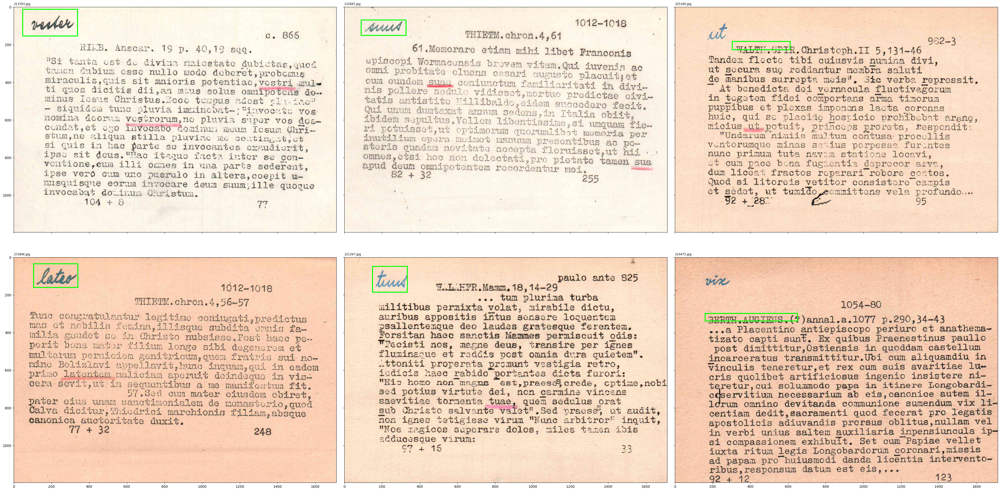

In [119]:
vis_cluster_sample_single(df, "../data/StatHD/MLW/zettel/", h=20, columns=3, rows=2)

In [90]:
len(df_view)

292

In [86]:
df_view['exists'] = check_exists(df_view, '../zettel/')

../zettel/47818.jpg
../zettel/47853.jpg
../zettel/47858.jpg
../zettel/47862.jpg
../zettel/47872.jpg
../zettel/47885.jpg
../zettel/47931.jpg
../zettel/47934.jpg
../zettel/47939.jpg
../zettel/53010.jpg
../zettel/53032.jpg
../zettel/53061.jpg
../zettel/53065.jpg
../zettel/53068.jpg
../zettel/53076.jpg
../zettel/53092.jpg
../zettel/53101.jpg
../zettel/53152.jpg
../zettel/53161.jpg
../zettel/53177.jpg
../zettel/53249.jpg
../zettel/53311.jpg
../zettel/53320.jpg
../zettel/53352.jpg
../zettel/53414.jpg
../zettel/53417.jpg
../zettel/53437.jpg
../zettel/53462.jpg
../zettel/53484.jpg
../zettel/53491.jpg
../zettel/53527.jpg
../zettel/53580.jpg
../zettel/53584.jpg
../zettel/53590.jpg
../zettel/53614.jpg
../zettel/53617.jpg
../zettel/53646.jpg
../zettel/53665.jpg
../zettel/53670.jpg
../zettel/53677.jpg
../zettel/53680.jpg
../zettel/53681.jpg
../zettel/53690.jpg
../zettel/53694.jpg
../zettel/53698.jpg
../zettel/53719.jpg
../zettel/53720.jpg
../zettel/53766.jpg
../zettel/53772.jpg
../zettel/53778.jpg


In [84]:
df_view[df_view['exists'] == 1]

,id,lemma,length_lemma,x1,y1,x2,y2,length,height,exists


In [82]:
True in (df_view['exists'] == 1).values

False